# Visualization and Evaluation of GAN-generated Artwork (Conditioned on Film Genres)

In this notebook, I used the cDCGAN model that I trained for 200 epochs on my dataset of artwork labelled by film genre (scraped from https://www.artstation.com/) to generate targeted fake images conditioned on the different film genres, e.g. horror, noir, cyberpunk, cartoon, and western. 

This notebook walks through the steps of:
- loading the necessary libraries (many of which contain self-defined functions)
- setting fixed parameters, e.g. root directories, batch size, image size.
- loading and visualizing the real dataset.
- initiating the cDCGAN model object (code for the discriminator, generator, and the cDCGAN class itself are loaded from the external modules).
- generating 10,000 images for each class (50,000 total).
- visualizing the generated images
    - visualizing a random batch of 64 generated images for each class
    - feeding the generator a fixed noise input with a different class label each time, and visualizing the generated images for different classes.
    - visualizing the progression of generated images for each class every 50 epochs from epoch 1 to 200.

# Import Libraries

In [1]:
# these libraries contain self-defined functions for running the cells below
from modules import *
from cdcgan_model.generator_discriminator_64 import *
from cdcgan_model.weights_init import *
from cdcgan_model.cdcgan import *
from helper_funcs.plot_and_index import *
from helper_funcs.generate_images import *
from eval_metrics.inception_score import *
from eval_metrics.FID import *


In [2]:
# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


# Set Parameters

In [3]:
# Root directory for dataset
dataroot = 'images'

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this size using a transformer.
image_size_art = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")


# Load Real Dataset for Comparison

The real dataset is resized to 64 x 64 pixels since this was the preprocessing step used during the training of the model. The images for each class of the real dataset are visualized for comparison to the generated data later on below.

In [4]:
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                           transforms.Resize(image_size_art),
                           transforms.CenterCrop(image_size_art),
                           transforms.RandomHorizontalFlip(p=0.5),
                           transforms.ToTensor(),
                           transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

# Create dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size = 128)

target_idx_dct = get_target_index(dataset)
total = 0

for k,v in target_idx_dct.items():
    print(f"Class {k} has {v['length']} entries.")
    total += v['length']
    
print(f"Total number of real images: {total}")
print(dataset.classes)

Class cartoon has 9924 entries.
Class cyberpunk has 9859 entries.
Class horror has 9868 entries.
Class noir has 3567 entries.
Class western has 6344 entries.
Total number of real images: 39562
['cartoon', 'cyberpunk', 'horror', 'noir', 'western']


## Real Cartoon Images

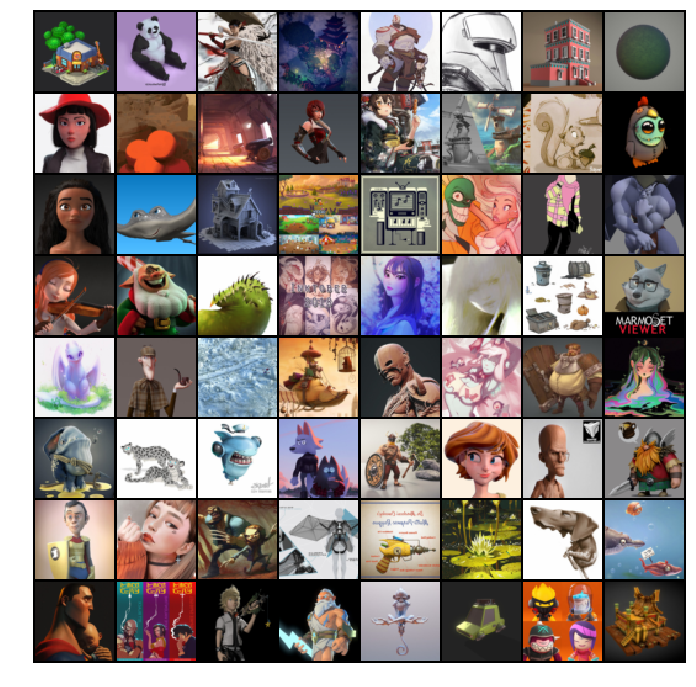

In [5]:
plot_batch(dataset, 'cartoon', batch_size = 64, nrow = 8)

## Real Cyberpunk Images

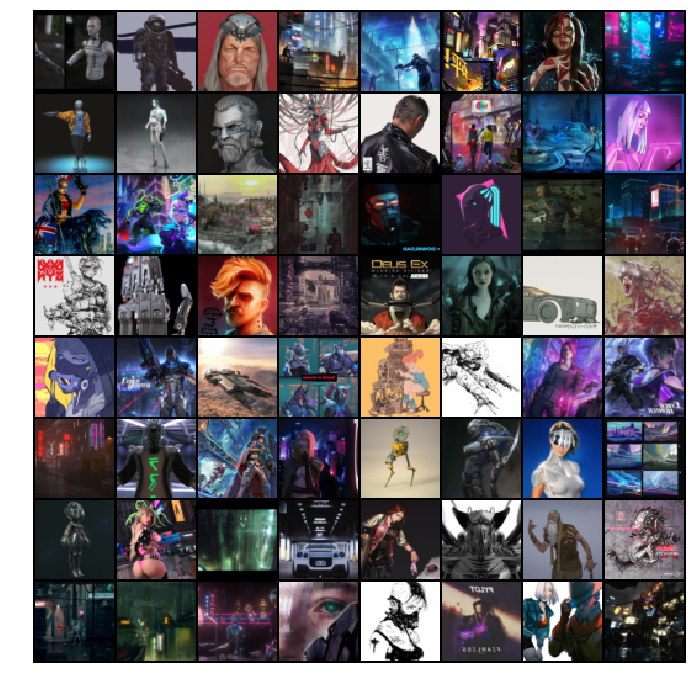

In [6]:
plot_batch(dataset, 'cyberpunk', batch_size = 64, nrow = 8)

## Real Horror Images

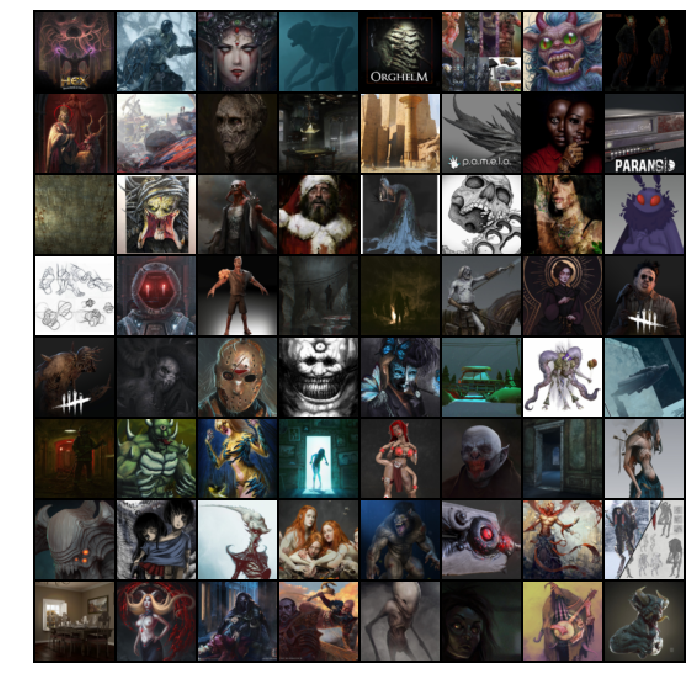

In [7]:
plot_batch(dataset, 'horror', batch_size = 64, nrow = 8)

## Real Noir Images

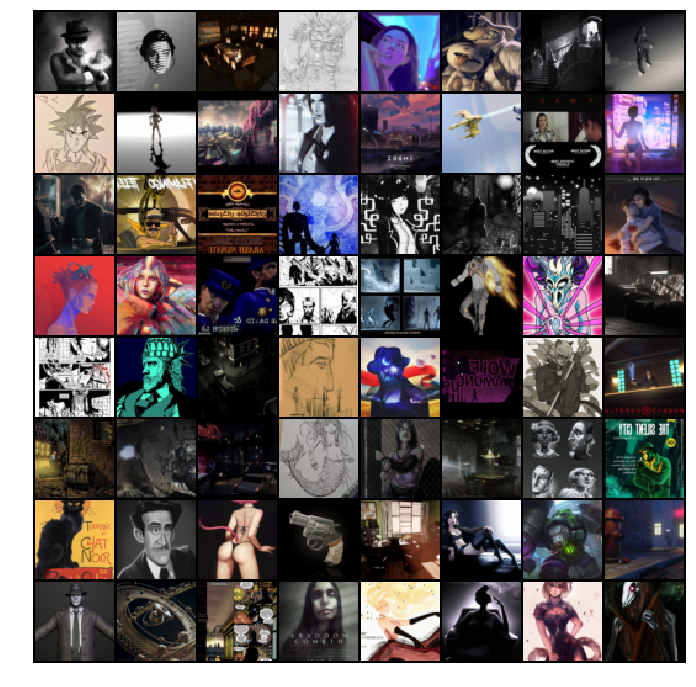

In [8]:
plot_batch(dataset, 'noir', batch_size = 64, nrow = 8)

## Real Western Images

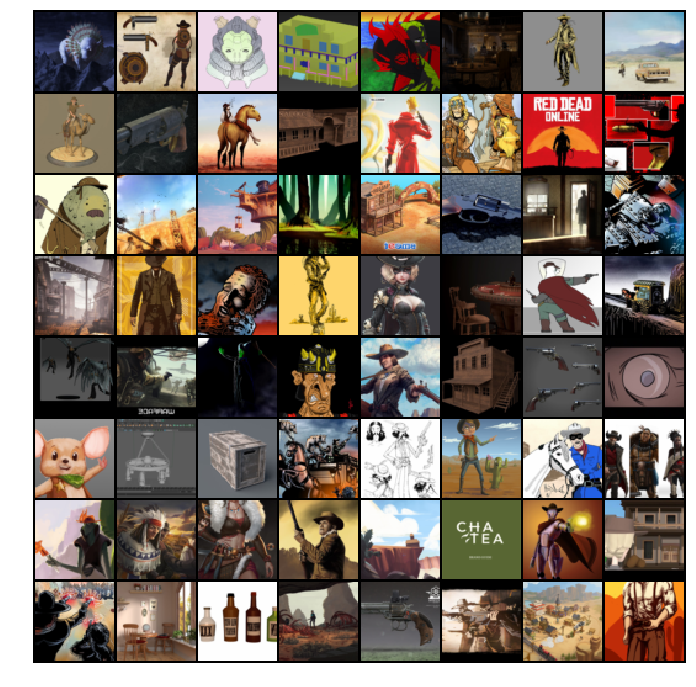

In [9]:
plot_batch(dataset, 'western', batch_size = 64, nrow = 8)

# Create cDCGAN Object

In [10]:
# Create the Discriminator
netD = Discriminator_64(len(dataset.classes), ngpu, nc = nc, ndf = 64).to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netD.apply(weights_init)

# Create the generator
netG = Generator_64(len(dataset.classes), ngpu, nz = nz, nc = nc, ngf = 64).to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2.
netG.apply(weights_init)

kwargs = {
    'dataloader': dataloader, # novel data dataloader
    'classes': dataset.classes, # novel dataset classes
    'save_dir':'capstone-novel-eval',
    'num_epochs': 0,
    'criterion': nn.BCELoss(), # Initialize BCELoss function
    'netD': netD,
    'netG': netG,
    'optimizerD': optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999)),
    'optimizerG': optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999)),
    'device': device,
    'nz': nz
}
    
cdcgan_novel = cDCGAN(**kwargs)

capstone-novel-eval directory exists.
capstone-novel-eval/checkpoints directory exists.
capstone-novel-eval/fake_images directory exists.


# Load latest epoch

In [11]:
cdcgan_novel.load('capstone-model-novel-output/checkpoints/checkpoint_e200.pth.tar', disp = True)


=> loading checkpoint: capstone-model-novel-output/checkpoints/checkpoint_e200.pth.tar
=> loaded checkpoint: capstone-model-novel-output/checkpoints/checkpoint_e200.pth.tar
Last epoch was 200


# Generate Fake Images

In [12]:
generate_fake_images(model = cdcgan_novel, classes = dataset.classes, 
                     number_of_images = 0, nz = nz,
                     device = device, 
                     save_dir = 'capstone-novel-eval/fake_images',
                     save = True)


No images to generate. Exiting function.


# Plot Fake Images Generated for Each Class

In [13]:
# import dataset of generated images    
gen_dataset = dset.ImageFolder(
                    root='capstone-novel-eval/fake_images',
                   transform=transforms.Compose([
                   transforms.Resize(image_size_art),
                   transforms.CenterCrop(image_size_art),
                   transforms.RandomHorizontalFlip(p=0.5),
                   transforms.ToTensor(),
                   transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                   ]))

# Create dataloader
gen_dataloader = torch.utils.data.DataLoader(gen_dataset, batch_size = 128)

# create dictionary of class indices for generated dataset
target_idx_dct = get_target_index(gen_dataset)
for k,v in target_idx_dct.items():
    print(f"Class {k} has {v['length']} entries.")



Class cartoon has 10000 entries.
Class cyberpunk has 10000 entries.
Class horror has 10000 entries.
Class noir has 10000 entries.
Class western has 10000 entries.


## Generated Cartoon Images

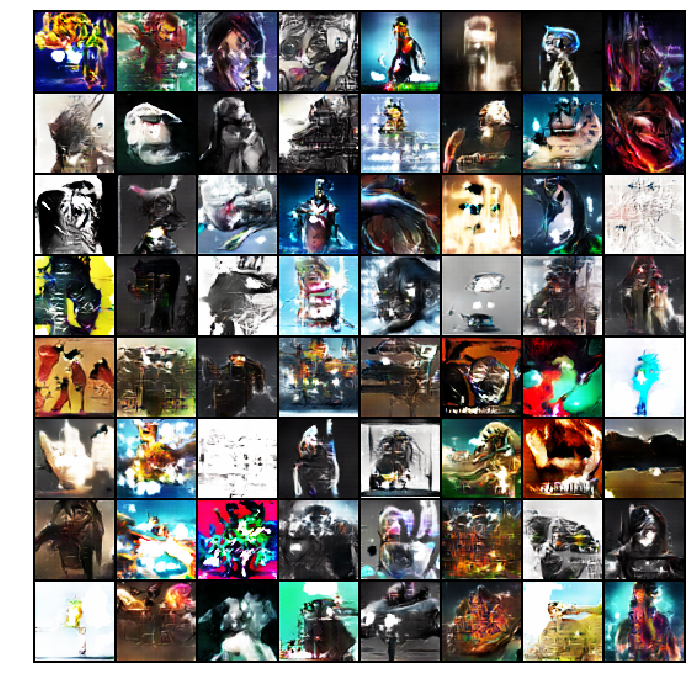

In [28]:
plot_batch(gen_dataset, 'cartoon', batch_size = 64, nrow = 8)

## Generated Cyberpunk Images

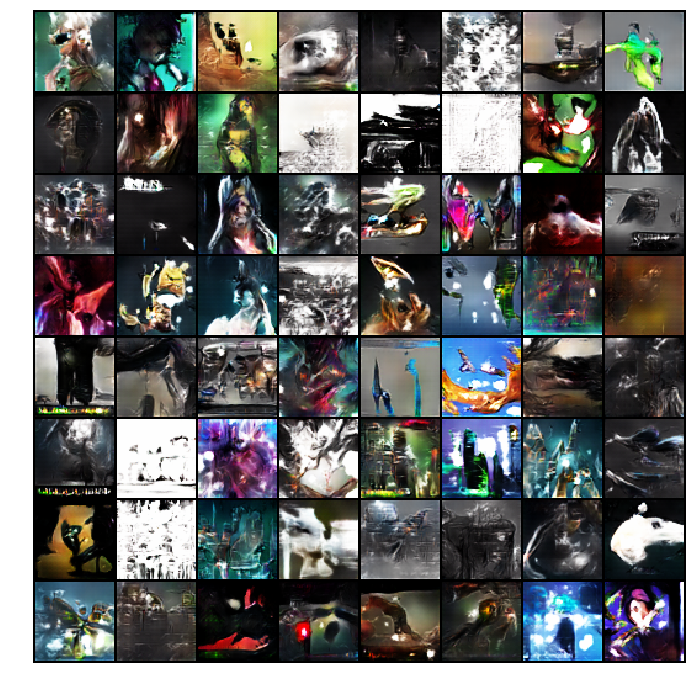

In [33]:
plot_batch(gen_dataset, 'cyberpunk', batch_size = 64, nrow = 8)

## Generated Horror Images

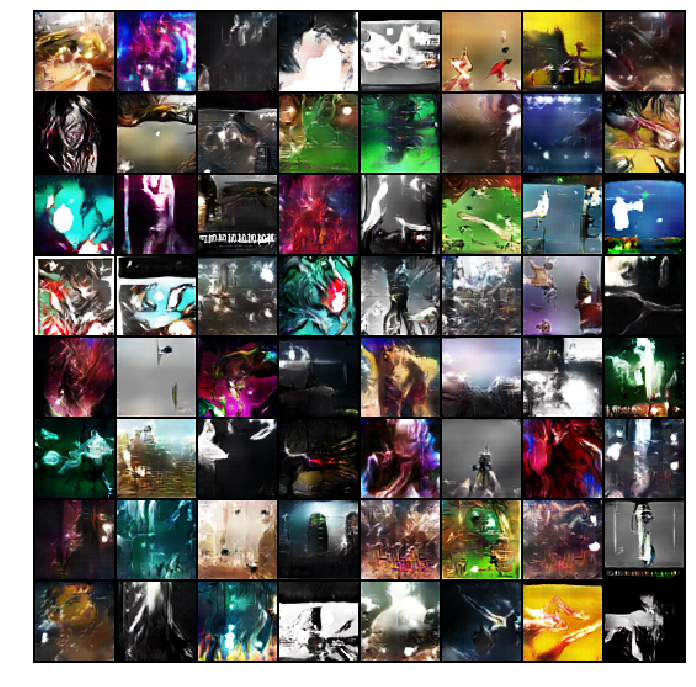

In [46]:
plot_batch(gen_dataset, 'horror', batch_size = 64, nrow = 8)

## Generated Noir Images

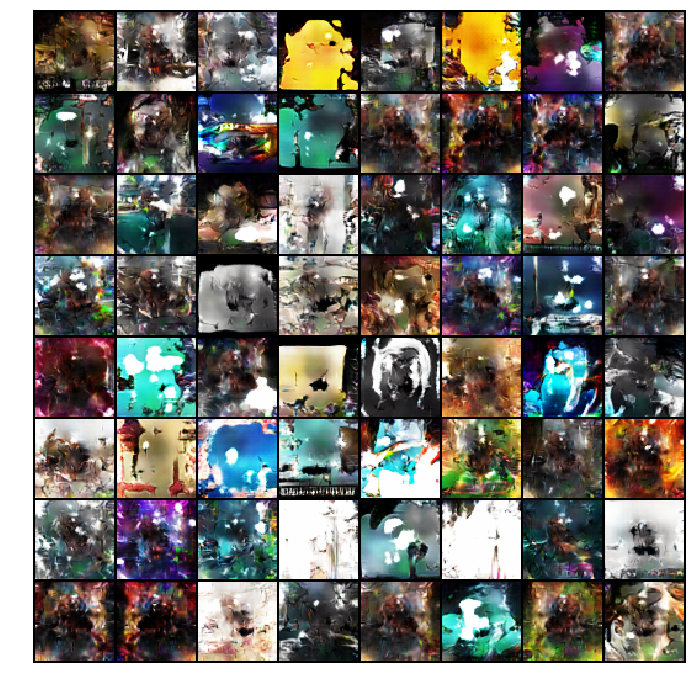

In [49]:
plot_batch(gen_dataset, 'noir', batch_size = 64, nrow = 8)

## Generated Western Images

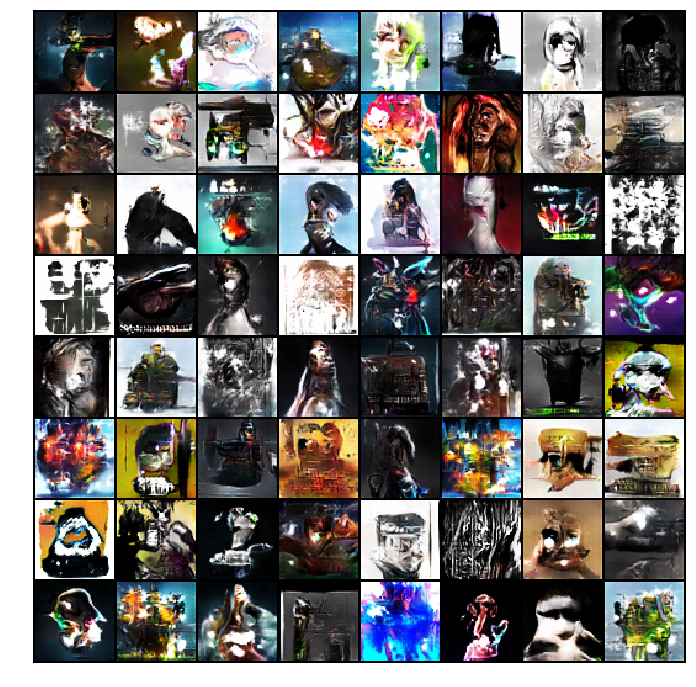

In [18]:
plot_batch(gen_dataset, 'western', batch_size = 64, nrow = 8)

# Compare Generated Images between Different Classes

Since the cDCGAN was trained with the film genre name as the embedded conditional, we can observe the effect of the conditional information (the different film genres) on the generated output by comparing the fake images generated when a fixed noise input is used.

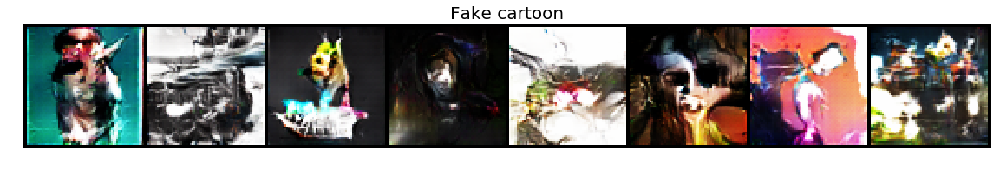

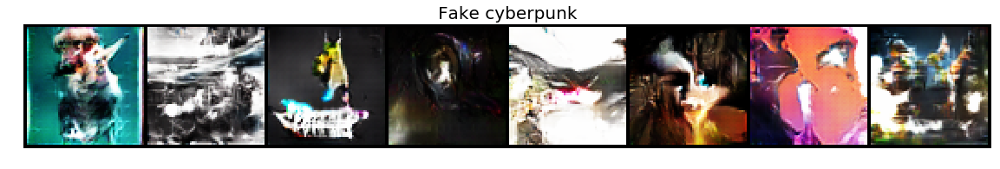

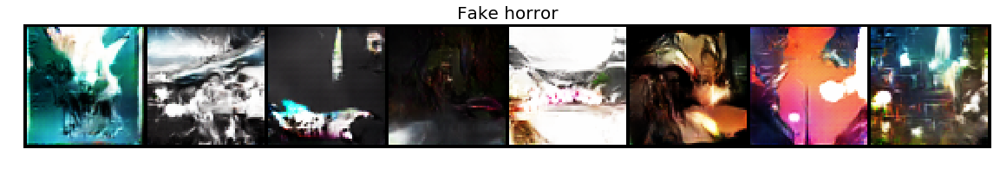

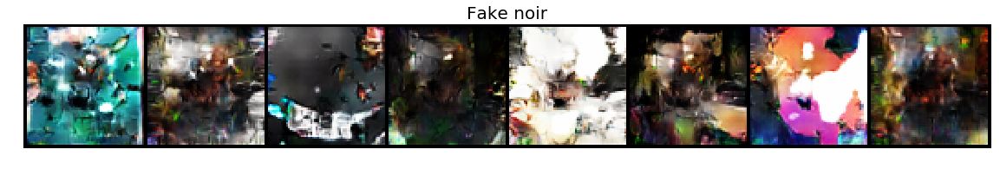

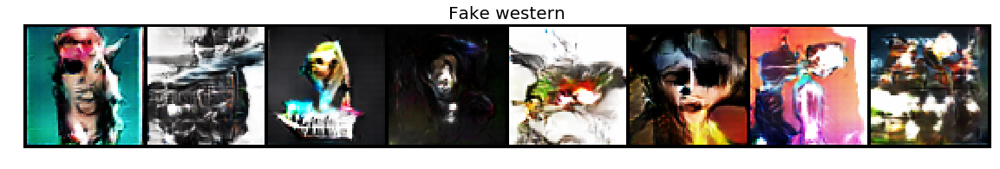

In [76]:
plot_gen_images(dataset.classes, cdcgan_novel, nz = nz, device = device, no_of_images = 8)

# Plot Generated Images at Different Training Epochs

The model weights at each training epoch were saved as checkpoints. As such, the progression of the image generation process for the different classes can be observed.

## Cartoon Class Progression

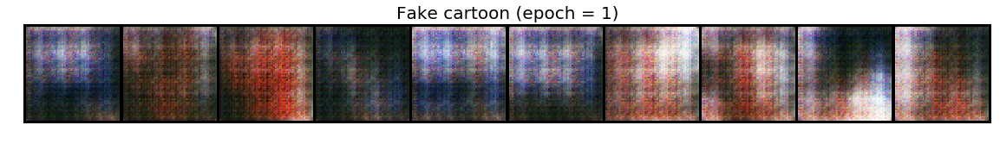

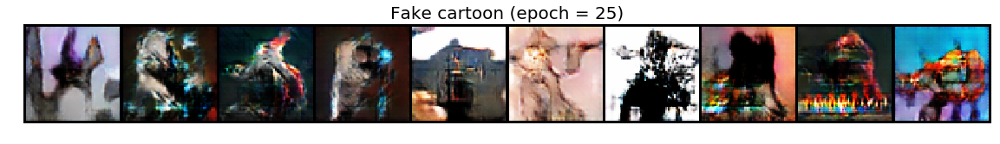

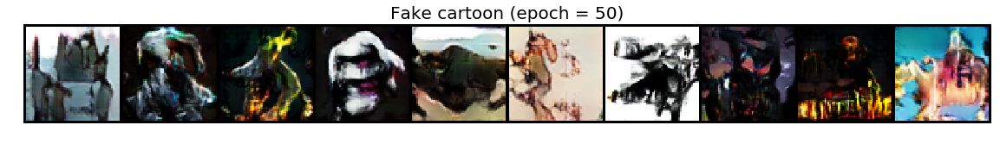

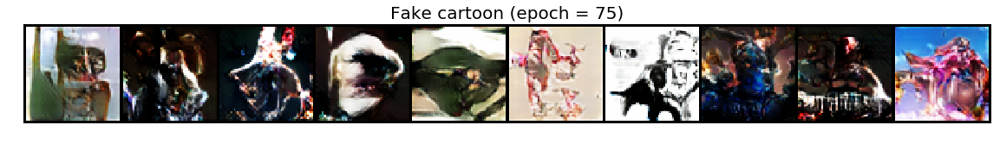

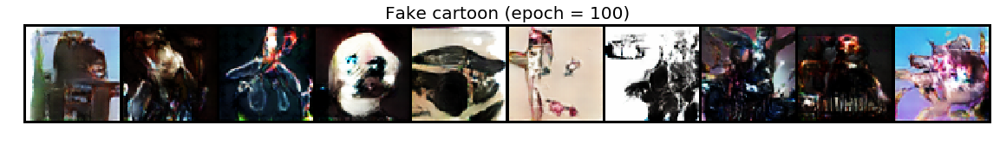

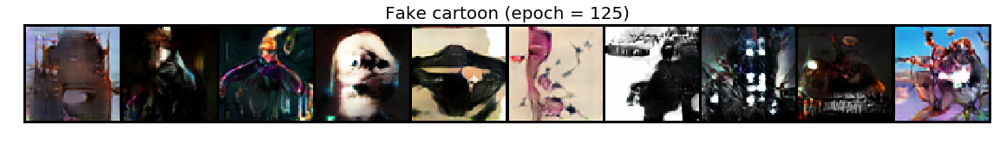

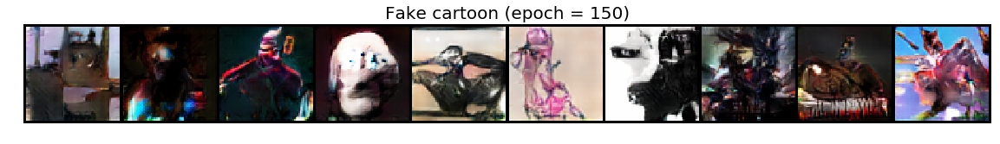

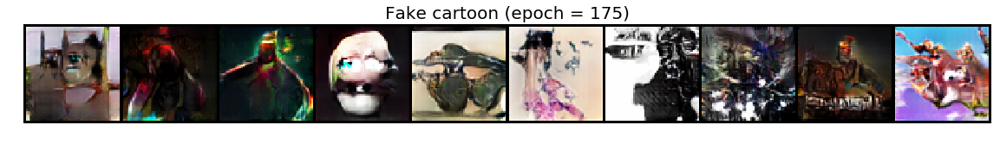

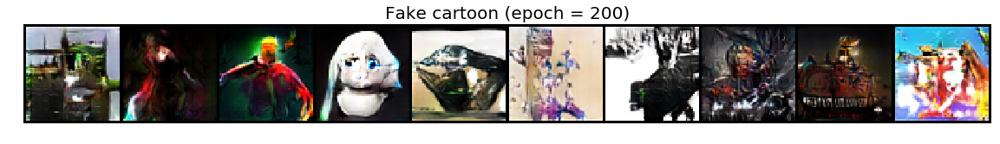

In [20]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'cartoon', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)

## Cyberpunk Class Progression

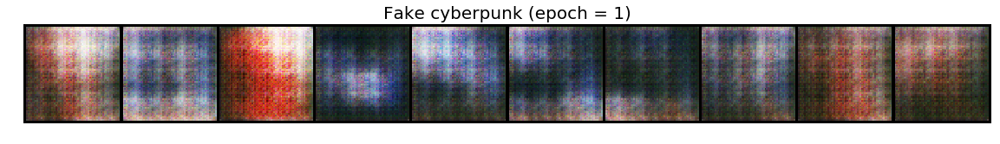

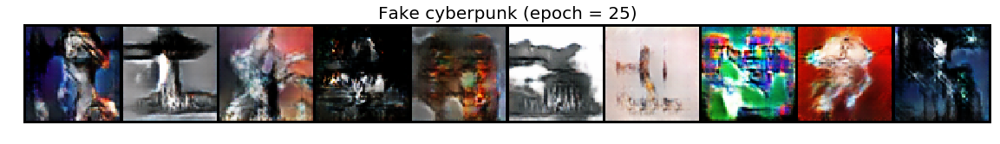

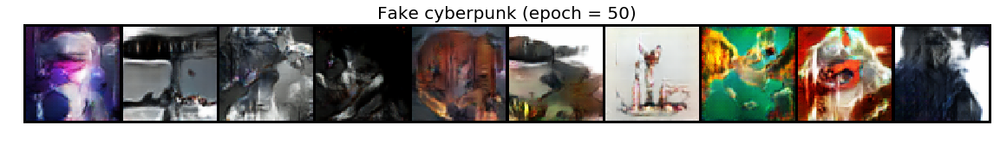

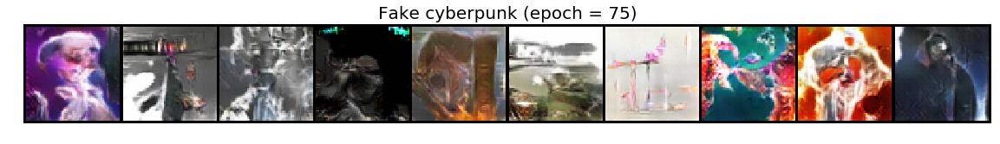

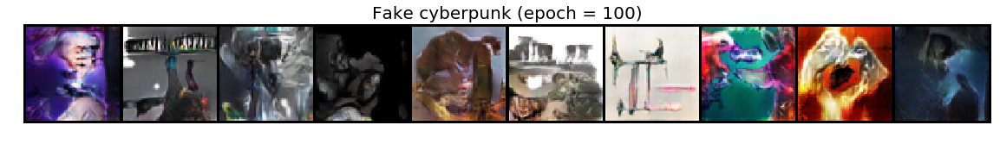

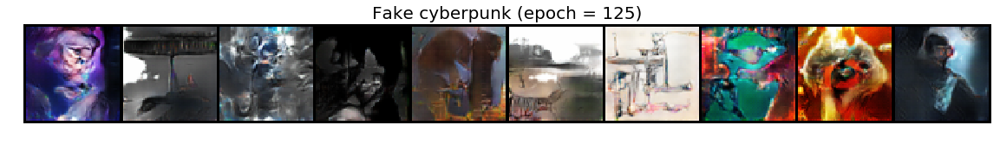

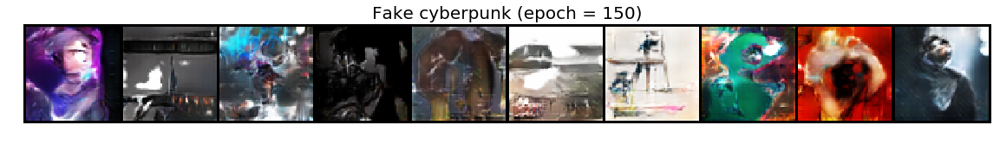

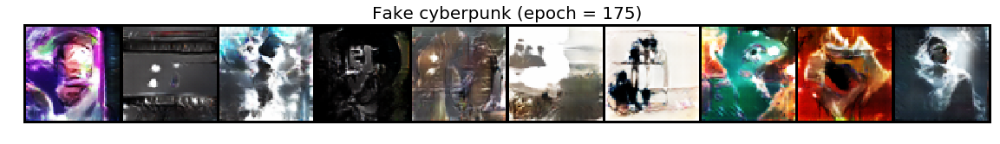

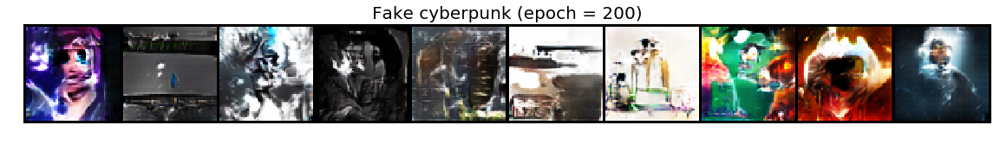

In [77]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'cyberpunk', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)

## Horror Class Progression

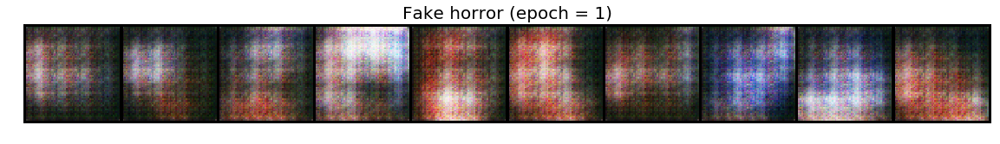

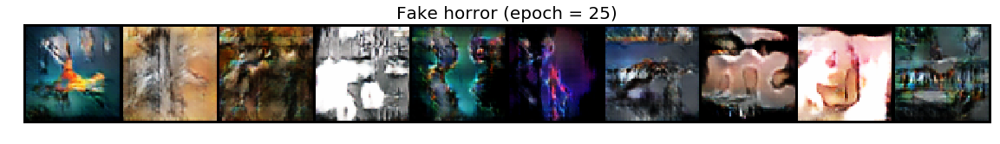

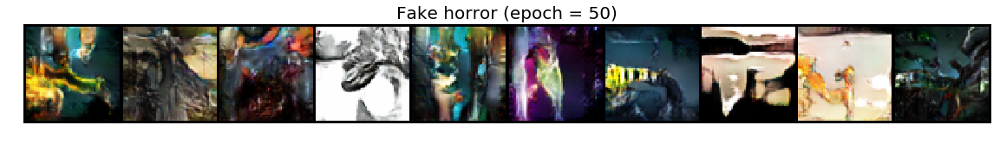

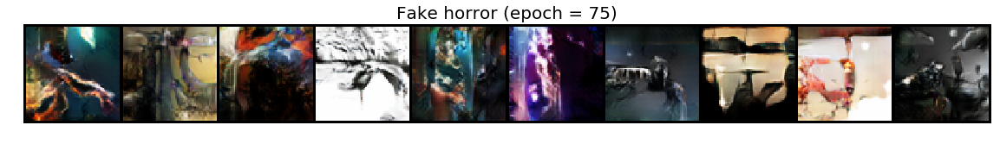

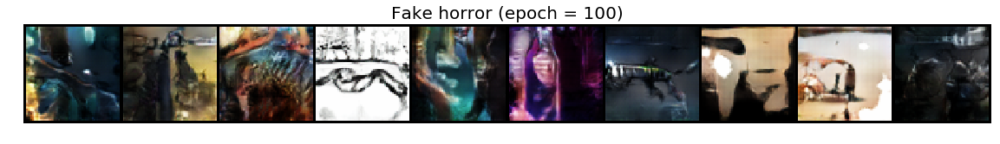

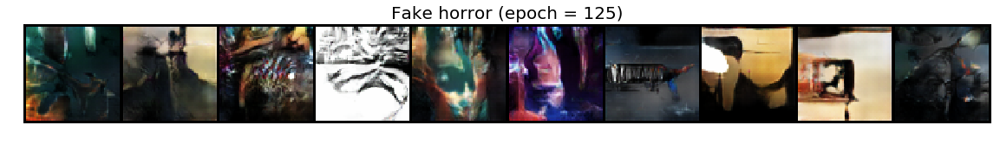

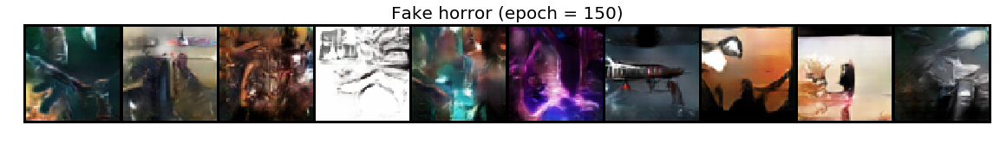

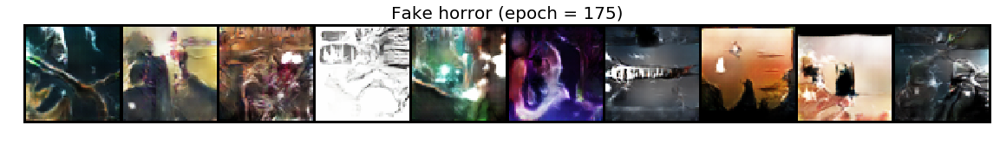

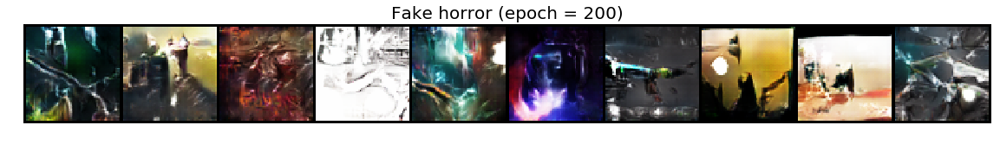

In [79]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'horror', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)

## Noir Class Progression

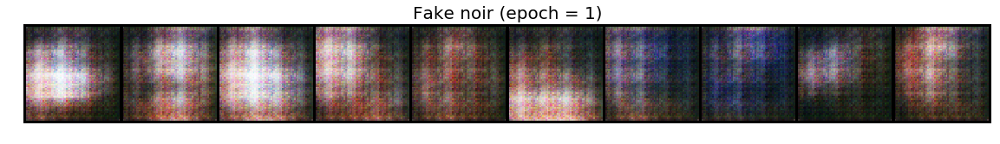

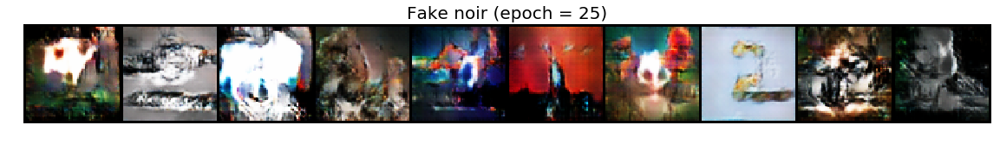

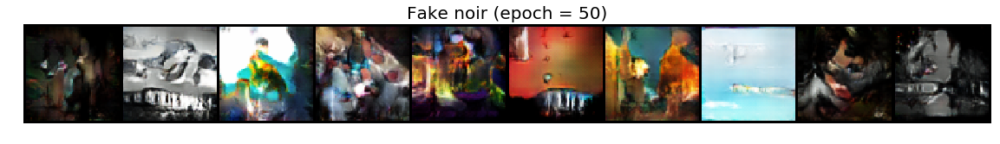

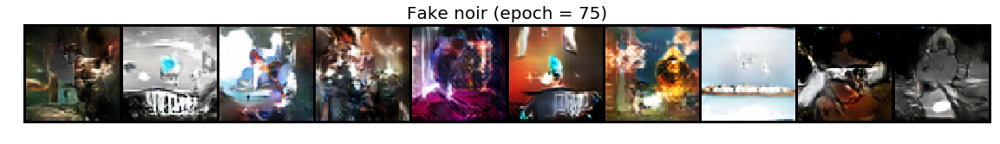

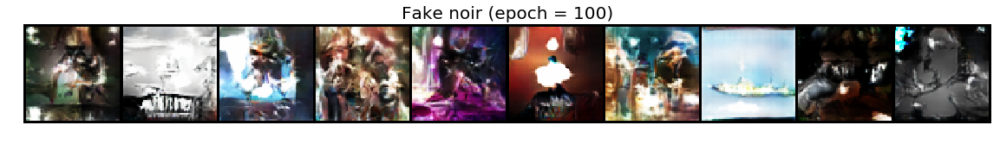

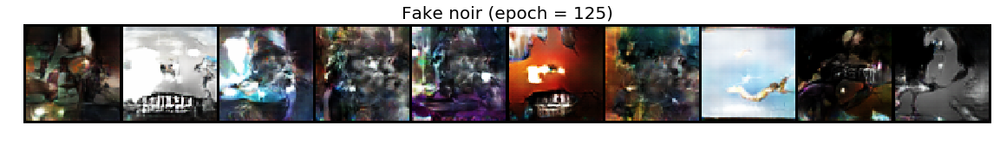

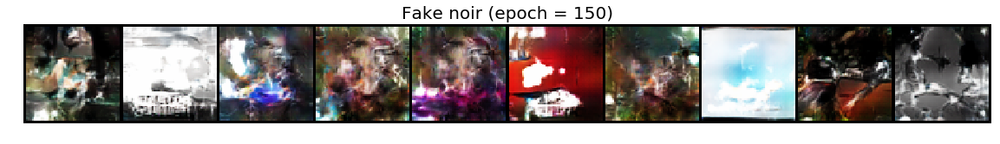

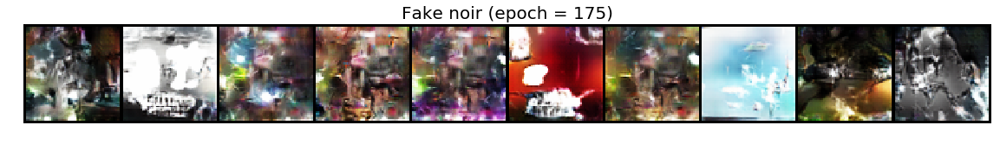

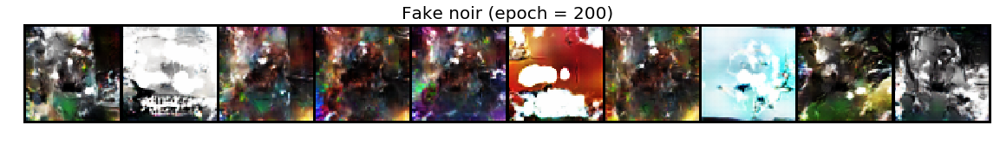

In [80]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'noir', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)

## Western Class Progression

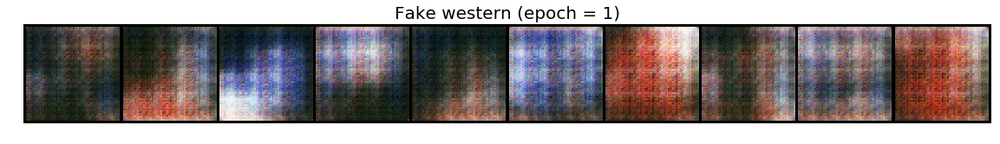

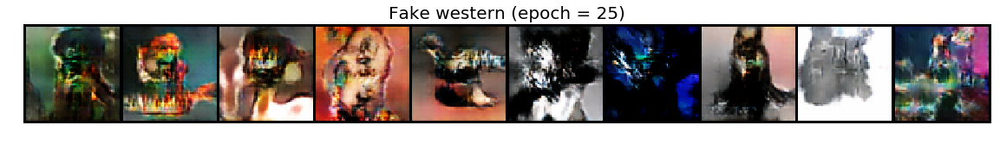

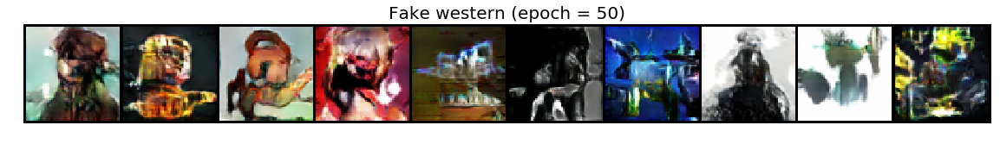

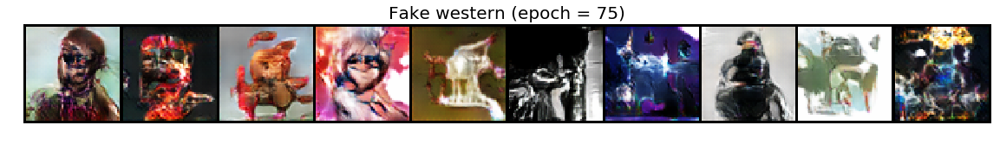

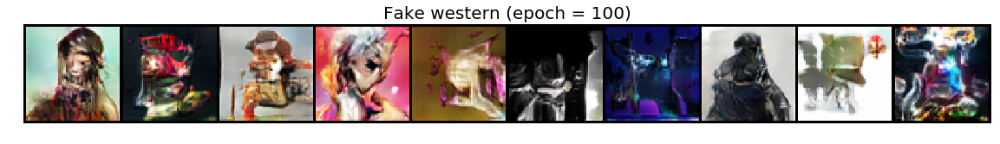

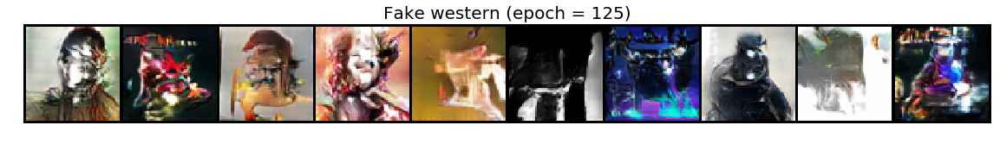

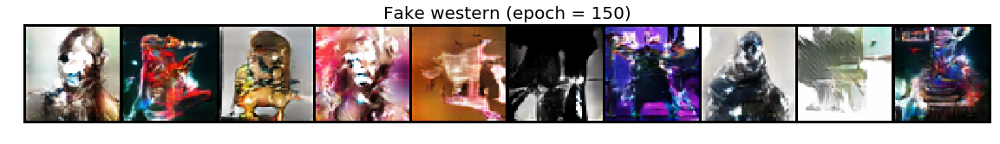

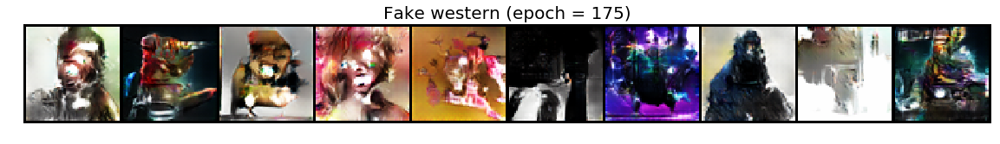

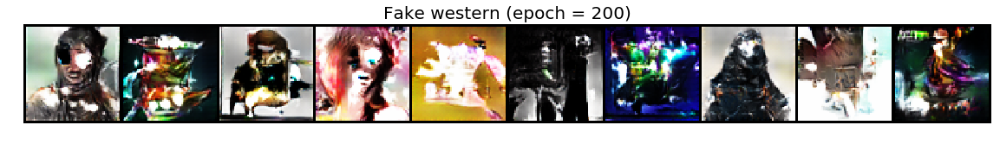

In [24]:
plot_progression(model = cdcgan_novel, classes = dataset.classes, class_name = 'western', 
                 checkpoint_dir = 'capstone-model-novel-output/checkpoints',
                 epoch_list = [1,25,50,75,100,125,150,175,200], no_of_images = 10,
                 nz = nz, device = device)